In [1]:
from PIL import Image
import h5py
import anubisPlotUtils as anPlot
import json
import numpy as np
import os
import hist as hi
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
matplotlib.use('TkAgg')  # or 'Qt5Agg', 'GTK3Agg', etc.
import mplhep as hep
hep.style.use([hep.style.ATLAS])
import sys
import ANUBIS_triggered_functions as ANT
import pandas as pd
import matplotlib.backends.backend_pdf
from matplotlib.ticker import MultipleLocator
import plotly
import plotly.graph_objs as go
import plotly.express as px


%matplotlib inline

Reading and clustering the data for 3 hour run, spatially and temporally (takes around 9 minutes overall, with most of time importing the data file)

In [2]:
current_directory=  os.path.dirname(os.getcwd())

data = ANT.importDatafile(current_directory+"\\ProAnubisData\\threeHourRun_24_3_1.h5")

etaHits, phiHits = ANT.divideHitCountsByRPC_Timed(data)

#ANT.importDatafile is from original scripts. ANT.divideHitCountsByRPC_Timed() is modified from original scripts. All other functions are new.

#Time_window for coincidence set at 15 ns.
#Temporal Clustering
coincident_hits_60s = ANT.FindCoincidentHits(etaHits,phiHits,15)

#Spatial Clustering
coincident_hits_60s_clustered = ANT.cluster(coincident_hits_60s)

0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0

In [3]:
print(len(etaHits[0]))

92241


In [4]:
def interactive_muon_plot(centroid,d,event_coords):
    #Coefficients = [a,b,c]
    #event_coords = [[x0,y0,z0],[x1,y1,z1],...,[x5,y5,z5]]

    # Generate line coordinates
    t_values = np.linspace(-150, 150, 100)
    line_coordinates = centroid.reshape(-1, 1) + d.reshape(-1, 1) * t_values.reshape(1, -1)

    x_coords = [x[0] for x in event_coords]
    y_coords = [y[1] for y in event_coords]
    z_coords = [z[2] for z in event_coords]


    RPC_origins = [[0,0,0],[0,0,1.2],[0,0,2.4],[0,0,61.2],[0,0,121.2],[0,0,122.4]]
    RPC_dimensions = [180,99,1.2]

    #Calculate vertices for RPCs
    rpc_vertices = []
    for i in range(6):
        rpc_vertices.append(ANT.calculate_cuboid_vertices(RPC_origins[i],RPC_dimensions))

    # Configure Plotly to be rendered inline in the notebook.
    plotly.offline.init_notebook_mode()

    # Configure the trace for the RPCs
    rpc_0 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[0]],
        y=[vertex[1] for vertex in rpc_vertices[0]],
        z=[vertex[2] for vertex in rpc_vertices[0]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    rpc_1 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[1]],
        y=[vertex[1] for vertex in rpc_vertices[1]],
        z=[vertex[2] for vertex in rpc_vertices[1]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    rpc_2 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[2]],
        y=[vertex[1] for vertex in rpc_vertices[2]],
        z=[vertex[2] for vertex in rpc_vertices[2]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    rpc_3 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[3]],
        y=[vertex[1] for vertex in rpc_vertices[3]],
        z=[vertex[2] for vertex in rpc_vertices[3]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    rpc_4 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[4]],
        y=[vertex[1] for vertex in rpc_vertices[4]],
        z=[vertex[2] for vertex in rpc_vertices[4]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    rpc_5 = go.Mesh3d(
        x=[vertex[0] for vertex in rpc_vertices[5]],
        y=[vertex[1] for vertex in rpc_vertices[5]],
        z=[vertex[2] for vertex in rpc_vertices[5]],
        i=[0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3],  # Indices for faces
        j=[1, 2, 3, 0, 4, 5, 6, 7, 5, 6, 2, 3, 7, 4, 0, 1],  # Indices for faces
        k=[2, 3, 0, 1, 6, 7, 4, 5, 1, 5, 6, 2, 3, 7, 4, 0],  # Indices for faces
        opacity=0.1,  # Set the opacity as needed
        color='green'  # Set the color of the cuboid
    )

    # Configure the trace.
    trace = go.Scatter3d(
        x=x_coords,  # <-- Put your data instead
        y=y_coords,  # <-- Put your data instead
        z=z_coords, # <-- Put your data instead
        mode='markers',
        marker={
            'size': 10,
            'opacity': 1.0,
        }
    )

    #Plot zenith angle
    # zenith = go.Vector(...)

    # Extract x, y, z coordinates from line coordinates
    x_line = line_coordinates[0]
    y_line = line_coordinates[1]
    z_line = line_coordinates[2]
    
    # Configure the trace for the line
    trace_line = go.Scatter3d(
        x=x_line,
        y=y_line,
        z=z_line,
        mode='lines',
        line={
            'color': 'red',
            'width': 2,
        },
        name='Line'
    )

    trace_centroid = go.Scatter3d(
        x=[centroid[0]],
        y=[centroid[1]],
        z=[centroid[2]],
        mode='markers',
        marker={
            'size': 5,
            'color': 'green',
        },
        name='Centroid'
    )

    # Configure the layout.
    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
        scene=dict(
            xaxis=dict(showgrid=True, gridcolor='rgb(211,211,211)', gridwidth=2,range=[-5,185], title = "x/cm"),
            yaxis=dict(showgrid=True, gridcolor='rgb(211,211,211)', gridwidth=2,range=[-5, 105],title = "y/cm"),
            zaxis=dict(showgrid=True, gridcolor='rgb(211,211,211)', gridwidth=2,range=[-5, 125],title="z/cm")
        )
    )

    #Include trace_centroid in data= [] to plot centroid on the plot.

    data = [trace,trace_line,rpc_0,rpc_1,rpc_2,rpc_3,rpc_4,rpc_5]

    plot_figure = go.Figure(data=data, layout=layout)

    # Render the plot.
    plotly.offline.iplot(plot_figure)

Filter Data to what you are interested in seeing

Takes around 0.5s to run

In [5]:
#Filter events depending on what you would like to look at.
#filter_events(data,minimum number of chambers hit, minimum number of RPCs hit)
cross_chamber_3_rpc_events = ANT.filter_events(coincident_hits_60s_clustered,2,3)
print("......")
all_6_rpcs = ANT.filter_events(coincident_hits_60s_clustered,3,6)

Number of events in filter = 20183
......
Number of events in filter = 2167


In [6]:
non_cross_chamber_3_rpc_events = ANT.filter_events(coincident_hits_60s_clustered,0,3)

Number of events in filter = 65434


Interesting to note that ProANUBIS triggered 92,241 times in 3hours on 3 eta hits across all RPCs. But the number of clustered events is only 65,434 for 15ns time_window for atleast 3 RPCs hit.

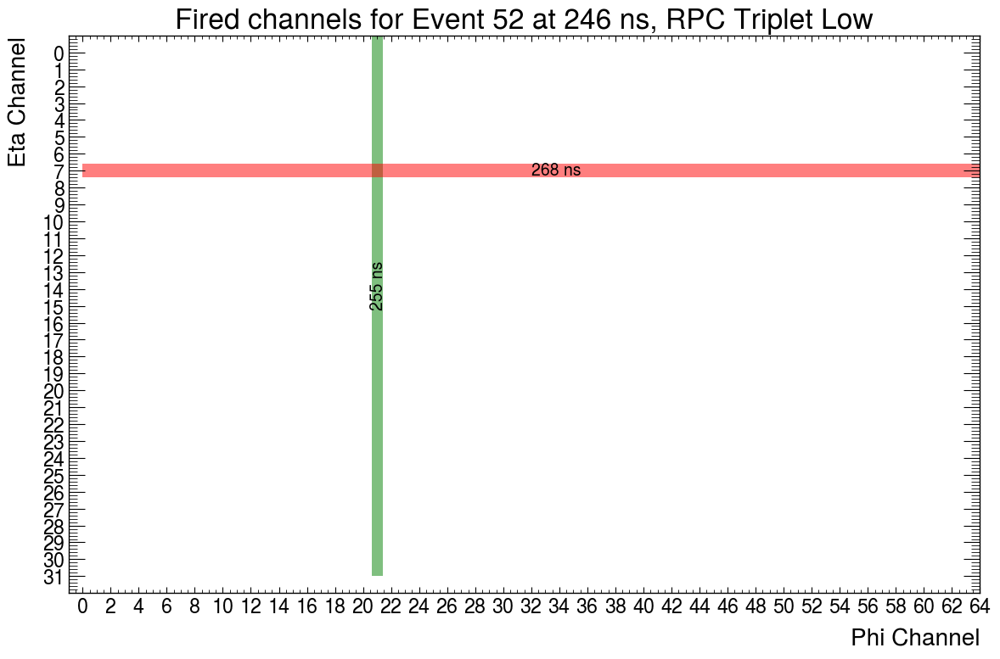

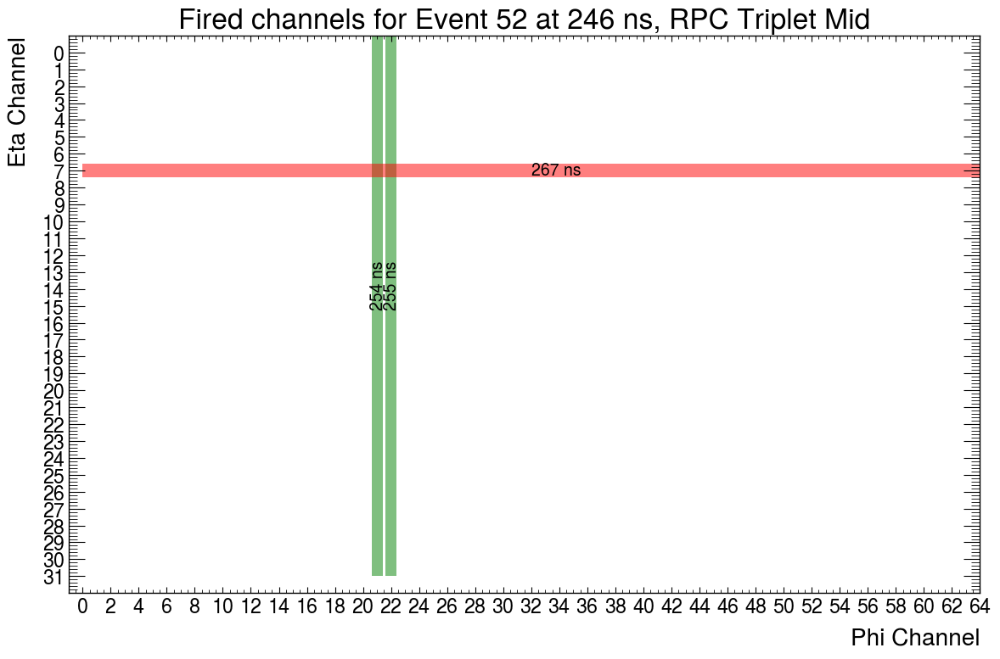

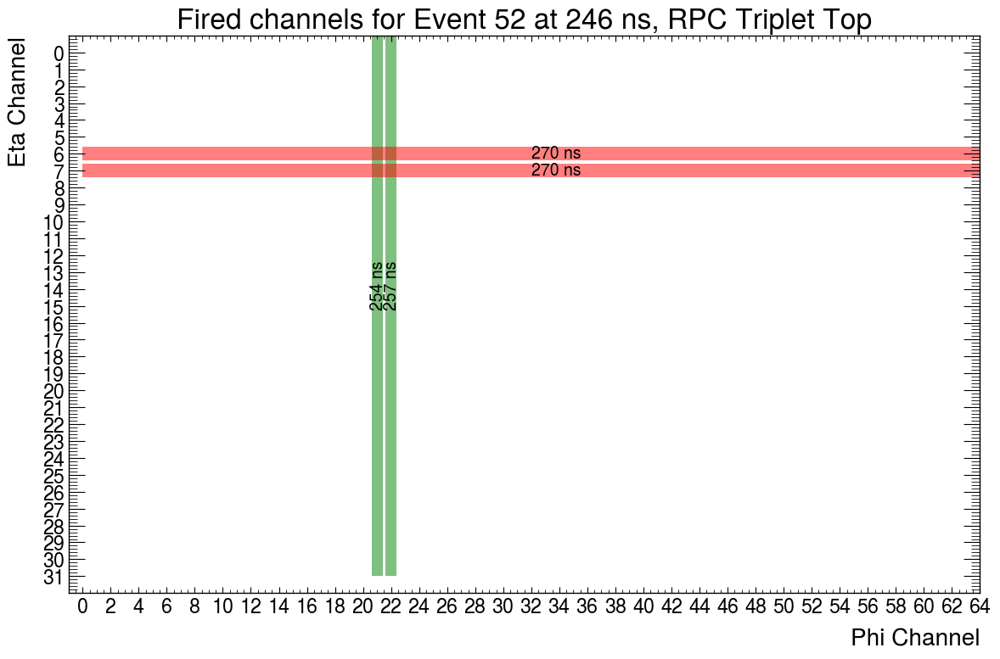

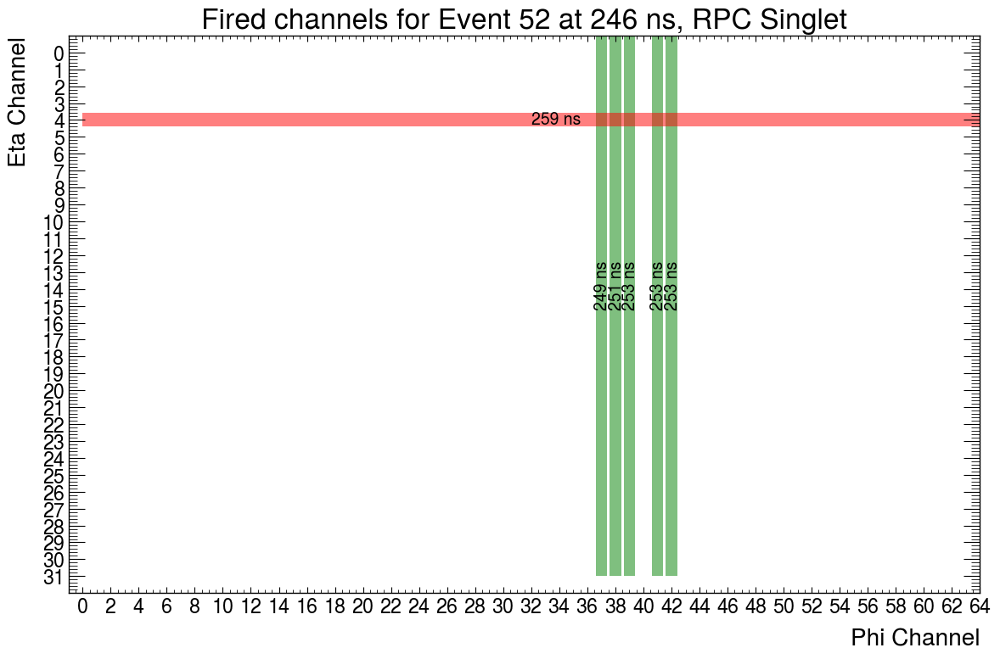

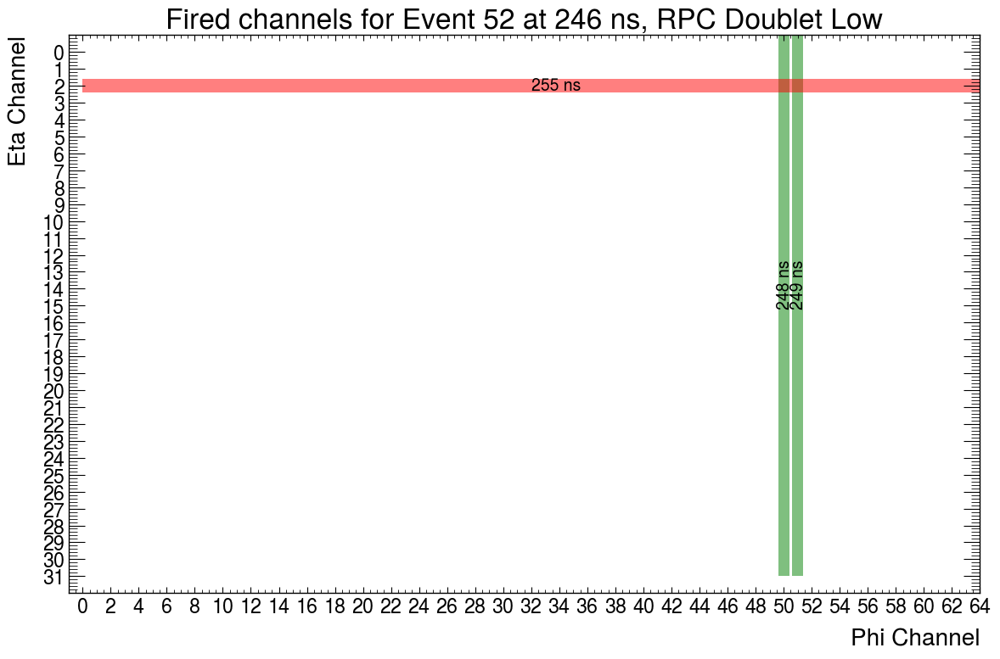

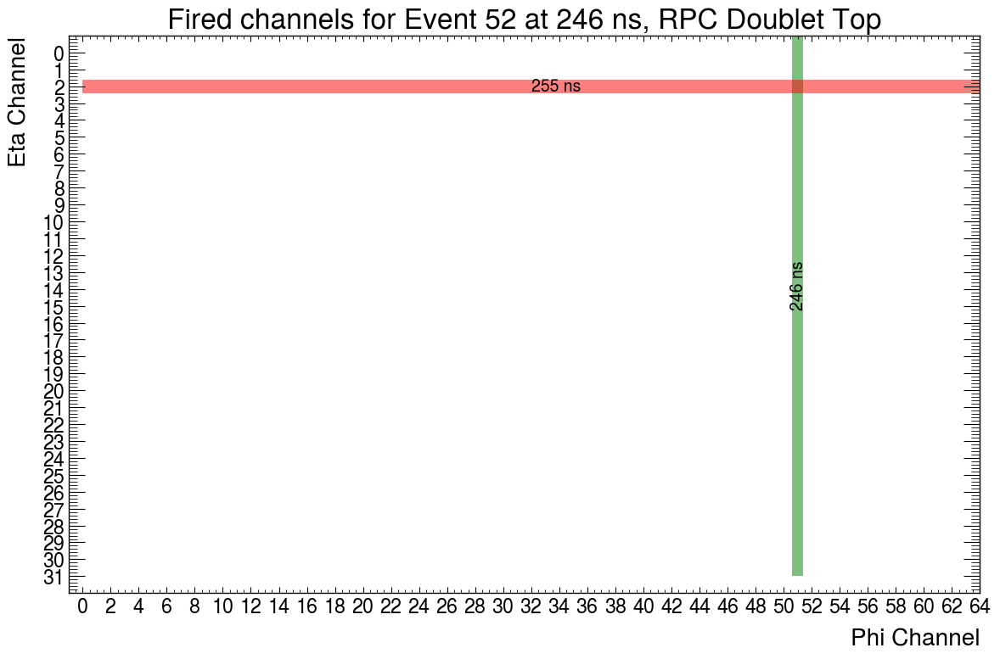

In [63]:
ANT.plot_event_cluster(ANT.convert_cluster_to_plot(all_6_rpcs[1]))

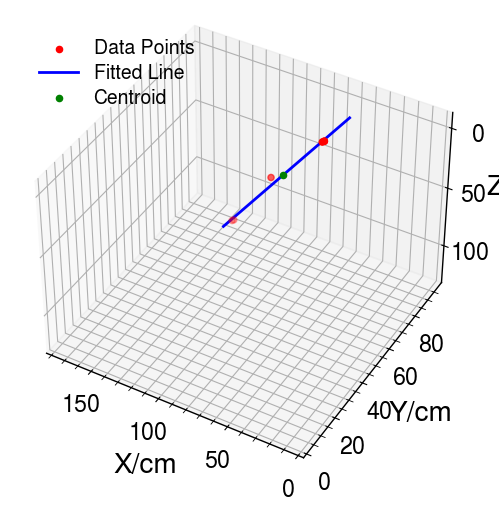

In [64]:
E17_223 = ANT.reconstruct(all_6_rpcs[1],3)

ANT.non_interactive_muon_plot(E17_223[0],E17_223[1],E17_223[2])


In [88]:
interactive_muon_plot(E17_223[0],E17_223[1],E17_223[2])

In [7]:
import numpy as np
import matplotlib.pyplot as plt

def plot_zenith_angle_distribution(angles, title):
    num_points = len(angles)

    theta_vals = np.linspace(0, np.pi / 2, 100000, endpoint=False)
    probs = [np.sin(x) * (np.cos(x))**2 for x in theta_vals]
    norm_probs = np.multiply(1 / (np.sum(probs)), probs)

    cdf = np.cumsum(norm_probs)
    cdf_spacing = np.pi / 2 / 1e5

    plt.figure(figsize=(16,8))

    # Plot histogram of data.
    num_bins = 100  # Adjust the number of bins as needed
    counts, bin_edges, _ = plt.hist(angles, bins=num_bins, alpha=0.7, edgecolor='black', label='ProANUBIS muon distribution')

    bin_midpoints = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(len(bin_edges) - 1)]
    midpoint_freq = []

    for j in range(len(bin_edges) - 1):
        start_bin_index = int(np.floor(bin_edges[j] / cdf_spacing))
        end_bin_index = int(np.floor(bin_edges[j + 1] / cdf_spacing))
        cum_prob = cdf[min(end_bin_index, len(cdf) - 1)] - cdf[start_bin_index]
        freq = cum_prob * num_points
        midpoint_freq.append(freq)

    # Plot distribution from literature.
    plt.plot(bin_midpoints, midpoint_freq, c='red', label='Cosmic Ray muon distribution')

    plt.xlabel("Zenith Angle/ degrees")  # Change the x-axis label
    plt.ylabel("Count")

    plt.legend(loc='upper right')
    
    # Adjust x-axis limits
    plt.xlim(left=0, right=np.pi / 2)
  
    # Convert x-axis ticks from radians to degree
    x_ticks_degrees = np.linspace(0, 90, num=10)
    x_ticks_radians = np.radians(x_ticks_degrees)

    plt.xticks(x_ticks_radians, x_ticks_degrees)

    plt.title(f"{title}")

    plt.show()

In [31]:
print(len(coincident_hits_60s_clustered))

251694


In [8]:
any_3_rpcs = ANT.filter_events(coincident_hits_60s_clustered,2,3)

Number of events in filter = 20183


In [9]:
def extract_coords(event,max_cluster_size):

    #This function converts spatially clusters in RPCs into x and y coordinates (z given by RPC number)
    # event = ['Event x',TIMEBIN, [[[RPC1_PHI_CLUSTERS],[RPC1_ETA_CLUSTERS]],[[...],[...]],...]

    #Extract x and y coords of cluster in event
    RPC_heights = [0.6,1.8,3.0,61.8,121.8,123] #Heights of middle point of each RPC, measured from the bottom of the Triplet Low RPC. Units are cm.
    distance_per_phi_channel = 2.7625 #cm
    distance_per_eta_channel = 2.9844 #cm
    
    coords = []


    for RPC in range(6):
        
        x_clusters = [x for x in event[2][RPC][0] if len(x)<=max_cluster_size] #phi direction
        y_clusters = [y for y in event[2][RPC][1] if len(y)<=max_cluster_size] #eta direction

        #Finding size of largest cluster, consider coordinates bad if largest cluster is larger than 6.
        x_clusters_lengths = [len(x) for x in event[2][RPC][0]]
        y_clusters_lengths = [len(y) for y in event[2][RPC][1]]

        max_length = max(max(x_clusters_lengths, default=0), max(y_clusters_lengths, default=0))

        x_coords = []
        y_coords = []

        for x_cluster in x_clusters:
           #x_cluster = [[RPC,CHANNEL,TIME,'phi'],...]
            phi_channels = [x[1] for x in x_cluster]
            #Convert the channel number into a measurement along the RPC.
            x_values = [(phi_channel+0.5)*distance_per_phi_channel for phi_channel in phi_channels]
            x_coords.append(np.mean(x_values))
            #x_error

        for y_cluster in y_clusters:
            #y_cluster = [[RPC,CHANNEL,TIME,'eta'],...]
            eta_channels_corrected = [31-y[1] for y in y_cluster] #corrected for labelling from 0 to 31.
            y_values = [(channel_num+0.5)*distance_per_eta_channel for channel_num in eta_channels_corrected]
            y_coords.append(np.mean(y_values))
            #x_error

        if x_coords and y_coords and max_length<6:
            coords.append([x_coords, y_coords])
        else:
            coords.append([[],[]])

    #coords = [[RPC1_coords],[RPC2_coords],[RPC3_coords],...]
    return(coords)

In [10]:
def reconstruct(event,max_cluster_size):
    max_residual = 100

    # event = ['Event x',TIMEBIN, [[[RPC1_PHI_CLUSTERS],[RPC1_ETA_CLUSTERS]],[[...],[...]],...]
    RPC_heights = [0.6,1.8,3.0,61.8,121.8,123] #Heights of middle point of each RPC, measured from the bottom of the Triplet Low RPC. Units are cm.

    #Extract x and y coords of cluster in event

    coords = extract_coords(event,max_cluster_size)

     # Count the number of empty RPCs
    empty_RPC_count = sum(1 for item in coords if item == [[], []])

    # # Count the number of non-empty RPCs at the beginning of the coords list
    # non_empty_count = sum(1 for item in coords[:3] if item != [[], []])

    # # If there are only three non-empty RPCs at the beginning, exit the function
    # if empty_RPC_count >= 3 and non_empty_count == 3:
    #     print("Failed to reconstruct, not enough coords")
    #     return None  # Exit the function

    # If less than 3 elements of coords are strings, exit the function
    if empty_RPC_count > 3:
        print("Failed to reconstruct, not enough coords")
        return None  # Exit the function

    #ITERATING OVER EVERY POSSIBLE COMBINATION OF x,y,z over all 3 RPCs (limited to one x,y per RPC).
    #Doesn't look particularly nice, but there are not many coordinates to loop over usually....

    combinations = ANT.generate_hit_coords_combo(coords,RPC_heights)

    #Now for each combo in combinations, attempt to reconstruct a path. See which one gives the best trajectory.

    #If success, print parameters of fitting function.
    #If fail, print reconstruction failed.

    residuals_current = np.inf
    optimised_coords = None
    optimised_d= None
    optimised_centroid= None

    for ind,combo in enumerate(combinations):

        centroid, d, residuals = ANT.fit_event(combo)
        if residuals < residuals_current:

            # If new fit is better than old then replace old fit.
            residuals_current = residuals
            optimised_centroid = centroid
            optimised_d = d
            optimised_coords = combinations[ind]

    #FLIP VECTOR SO IT POINTS DOWN!
    
    if optimised_d[2]  > 0:
        optimised_d = np.multiply(optimised_d,-1)

    if residuals_current<max_residual:
        return optimised_centroid, optimised_d, optimised_coords, combinations, residuals_current
    else:
        print("Failed to reconstruct")
        #return optimised_centroid, optimised_d, optimised_coords, combinations, residuals_current
        return None

In [267]:
d_vertical = np.array([0,1,1])
angles_3 = []

for i,filtered_event in enumerate(any_3_rpcs):

    result = reconstruct(filtered_event,3)

    if result is not None:
        #Only save angles that actually were reconstructed well
        theta = np.arccos(np.dot(d_vertical,result[1]) / ((np.sqrt(2))*np.linalg.norm(result[1])))
        if theta > np.pi /2:
            theta= np.pi - theta
        if   0 <= theta < 2*np.pi/180:
            print(f"Close to zero degrees: {i}")
        if 40*np.pi / 180 <= theta <= 50 * np.pi / 180:
            print(f"Close to 45 degrees: {i}")
        

        # if 40*np.pi/180 <= theta <= 50*np.pi/180:
        #     print(f"Close to 45 degrees: {i}")

        angles_3.append(theta)

    #ProAnubis setup is at 45 degrees to vertical. 
    #Project direction vector onto planes to work out phi and eta angular distributions. Should be no assymmetry in phi.
    #Expect asymmetry in eta. 

Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Close to 45 degrees: 9
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Close to 45 degrees: 18
Failed to reconstruct
Failed to reconstruct, not enough coords
Close to 45 degrees: 24
Failed to reconstruct, not enough coords
Close to 45 degrees: 31
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Close to 45 degrees: 42
Close to zero degrees: 44
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Close to 45 degrees: 59
Failed to reconstruct, not enough coords
Close to 45 degrees: 64
Close to 45 degrees: 67
Failed to reconstruct, not enough coords
Close to 45 degrees: 74
Failed to reconstruct, not enough coords
Failed to recon

Good events: 

any_3_rpcs:
11177,
10883,
7223,
6988

Low angle event 44 


all_6_rpcs[150] intersting

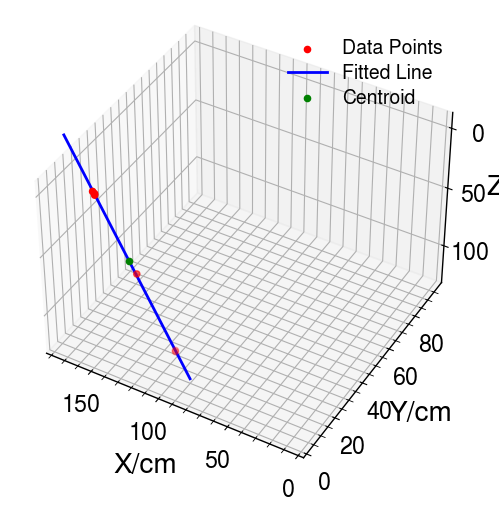

In [116]:
E_45 = ANT.reconstruct(all_6_rpcs[1500],3)

ANT.non_interactive_muon_plot(E_45[0],E_45[1],E_45[2])


In [11]:
def plot_event_cluster_save(event_cluster):

    multi_array = []
    current_directory=  os.path.dirname(os.getcwd())

    RPC_description = ['Triplet Low','Triplet Mid','Triplet Top','Singlet','Doublet Low','Doublet Top']

    #event_cluster = ['Event X', cluster_initial_time, [hit_locations]]
    #hit_locations = [[RPC,Channel,Hit_time,'eta/phi'],...]

    initial_time = event_cluster[1]
    RPC_events = event_cluster[2]

    # Extracting x and y data

    # [x[1],x[2]] = [Channel, Hit_time]
    phi_data = [[x[1],x[2]] for x in RPC_events if x[3]=='phi']
    eta_data = [[y[1],y[2]] for y in RPC_events if y[3]=='eta']

    for RPC in range(6):

        phi_data = [[x[1],x[2]] for x in RPC_events if x[3]=='phi' and x[0]==RPC]
        eta_data = [[y[1],y[2]] for y in RPC_events if y[3]=='eta' and y[0]==RPC]

        # Creating histogram
        plt.figure(figsize=(12, 8))
        # Plotting bars for active phi strips
        for x in phi_data:
            plt.bar(x[0], 32, width=0.8, color='green', alpha=0.5)
            plt.text(x[0]-0.5,16,f"{x[1]} ns",rotation=90)

        for y in eta_data:
            plt.barh(31-y[0], 64, height=0.8, color='red', alpha=0.5)
            plt.text(32,(31-y[0])-0.25,f"{y[1]} ns")

        #plt.colorbar(label='Counts')
        plt.xlabel('Phi Channel')
        plt.ylabel('Eta Channel')
        plt.title(f'Fired channels for {event_cluster[0]} at {initial_time} ns, RPC {RPC_description[RPC]}')
        plt.tight_layout()

        plt.xlim(-1, 64)
        plt.ylim(-1, 32)

        # Set x-axis ticks every 2 units
        ax = plt.gca()
        ax.xaxis.set_major_locator(MultipleLocator(2))

        # Set y-axis ticks to cover the entire range of eta channels
        ax.set_yticks(range(32))

        # Reverse y-axis ticks to match eta channel numbers
        ax.set_yticklabels(range(31, -1, -1))

        #plt.grid(True)
        plt.tight_layout()
        plt.savefig(current_directory+f"\\{event_cluster[0]}{RPC}.png")
        multi_array.append(current_directory+f"\\{event_cluster[0]}{RPC}.png")

    anPlot.combinePlots(multi_array,f"Hit_map,{event_cluster[0]},{initial_time}ns")
    for plot in multi_array:
        os.remove(plot)

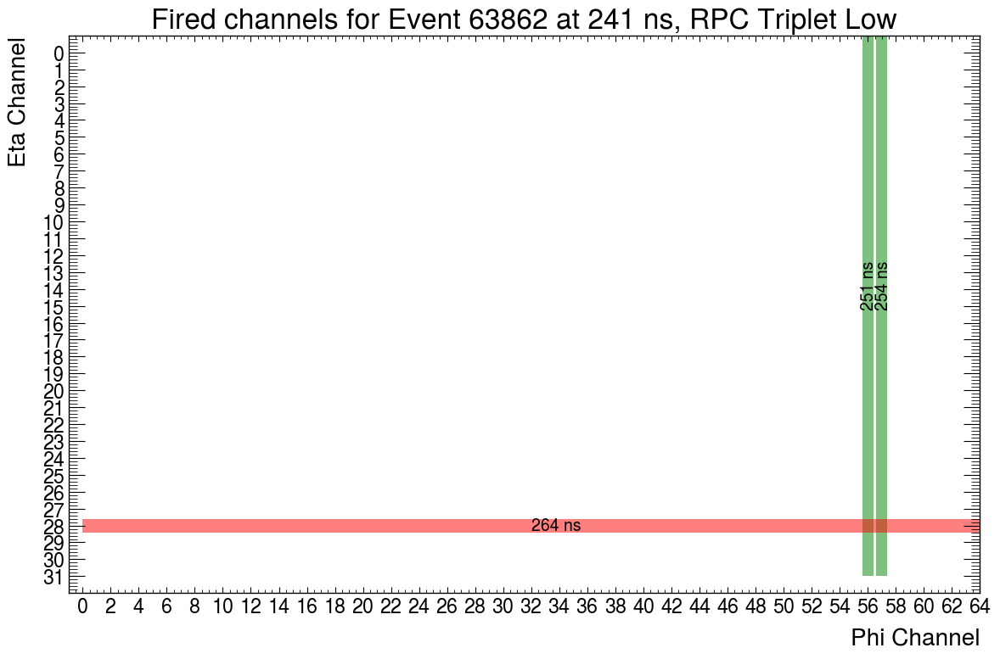

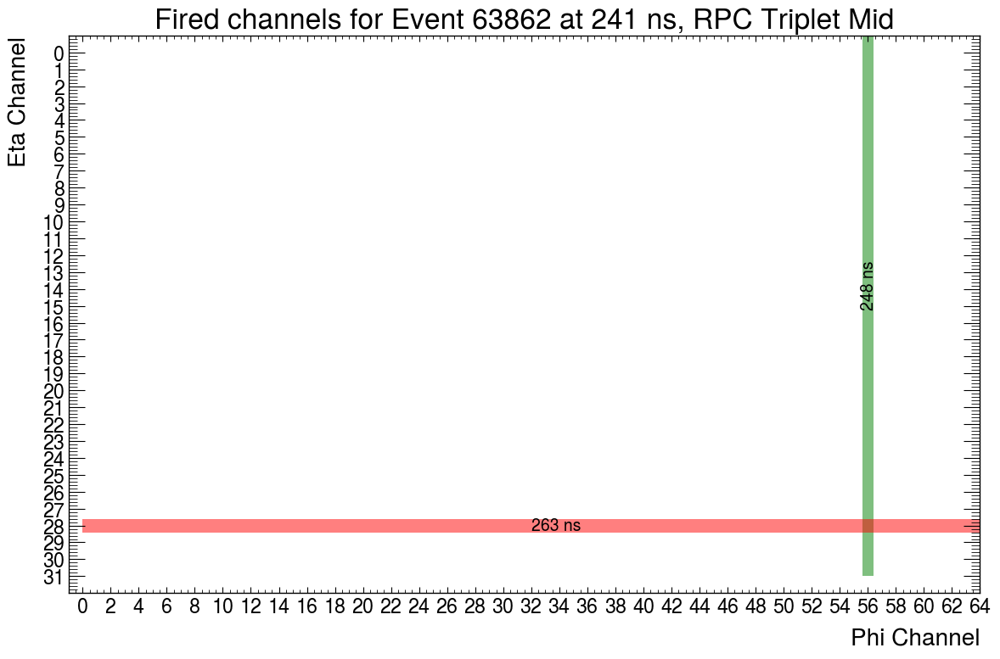

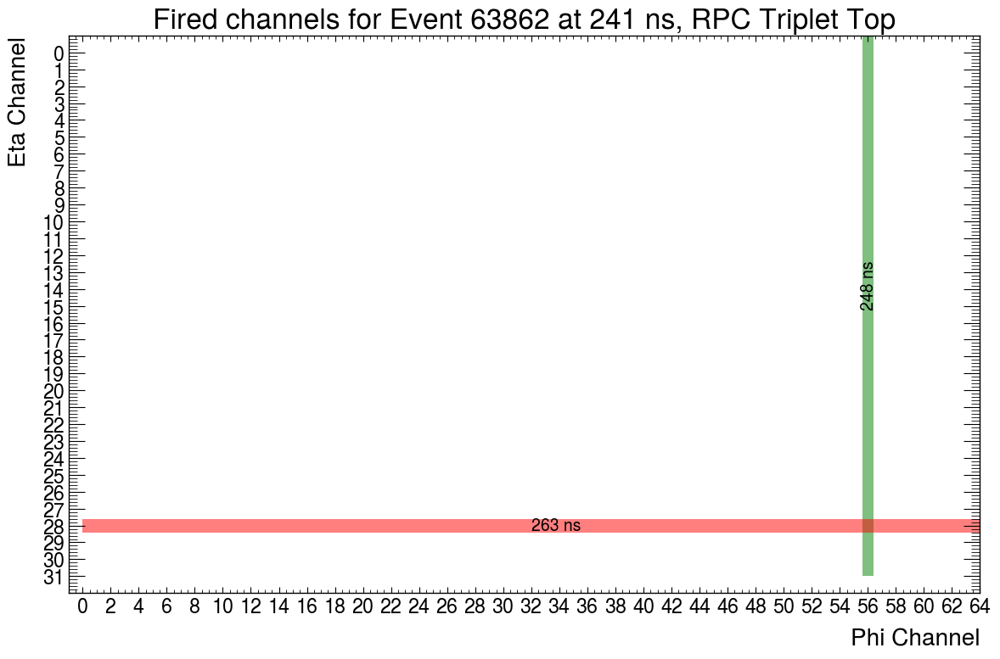

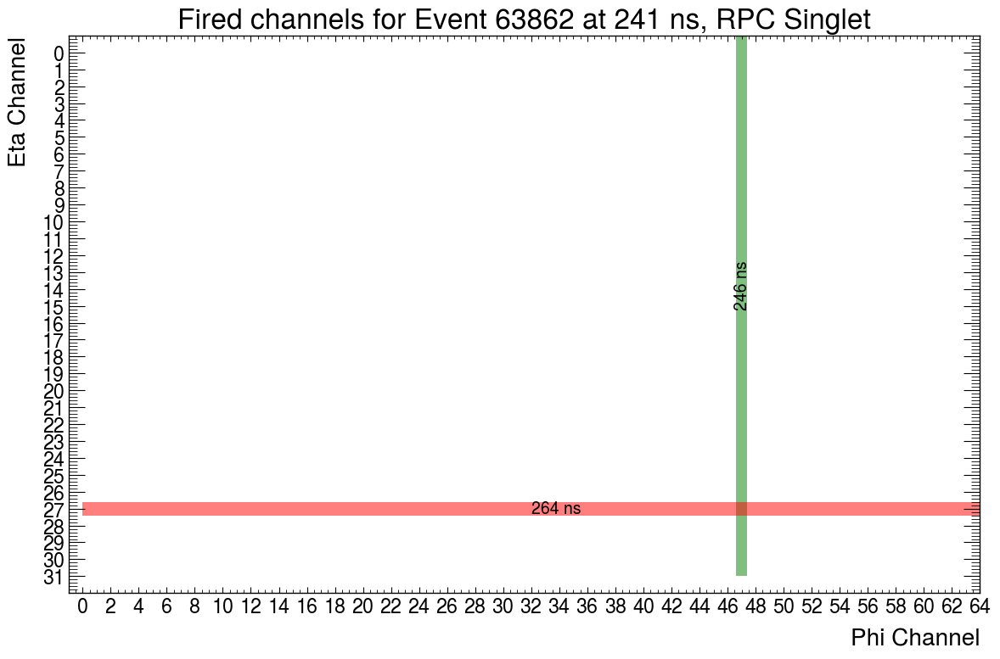

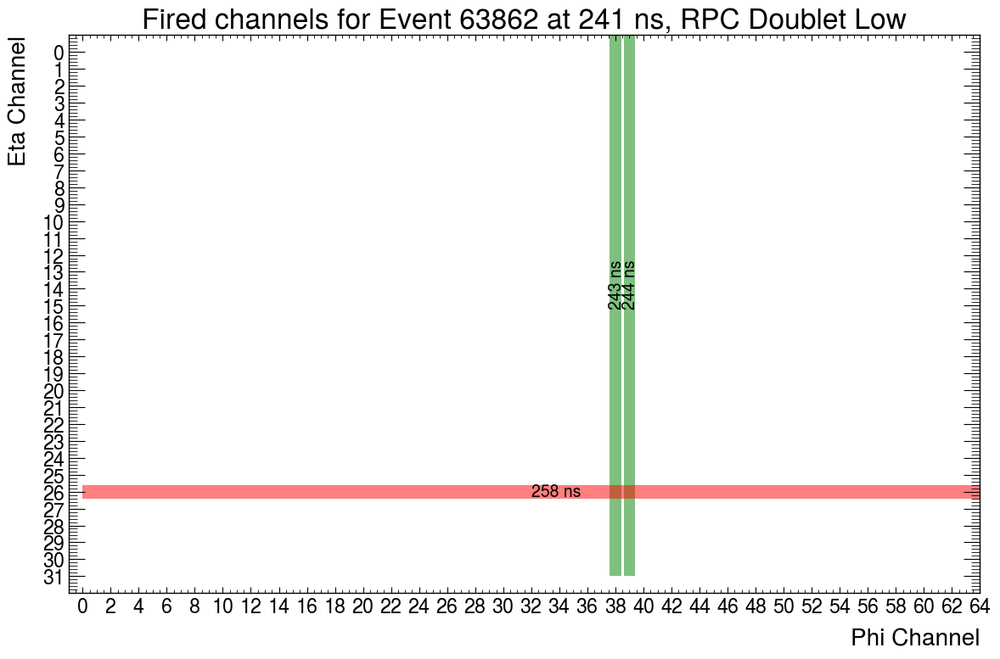

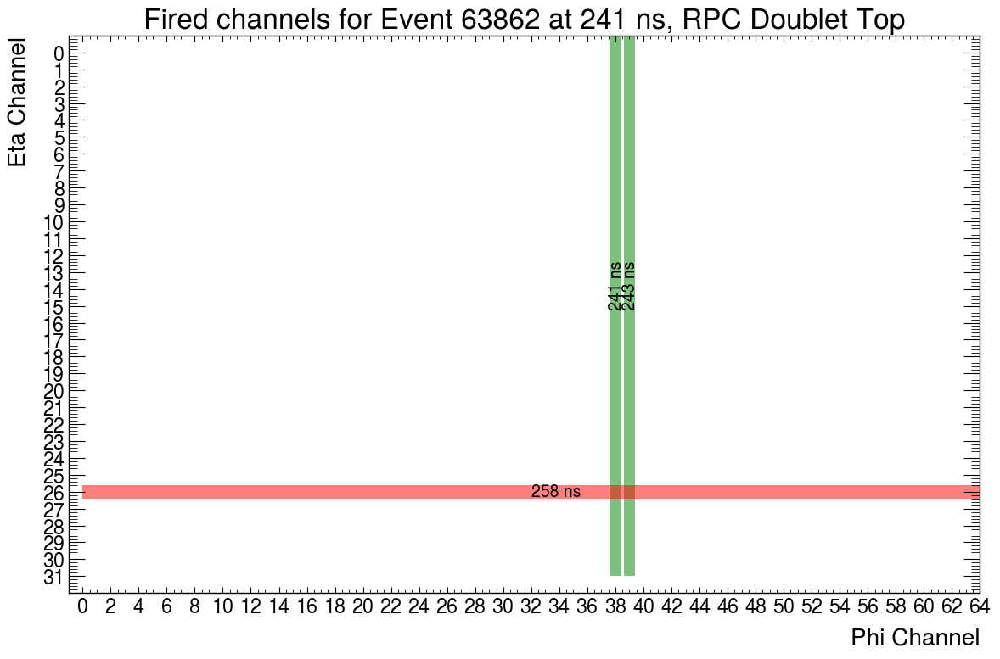

In [117]:
plot_event_cluster_save(ANT.convert_cluster_to_plot(all_6_rpcs[1500]))

In [118]:
interactive_muon_plot(E_45[0],E_45[1],E_45[2])

In [12]:
print(len(angles_3))

13724


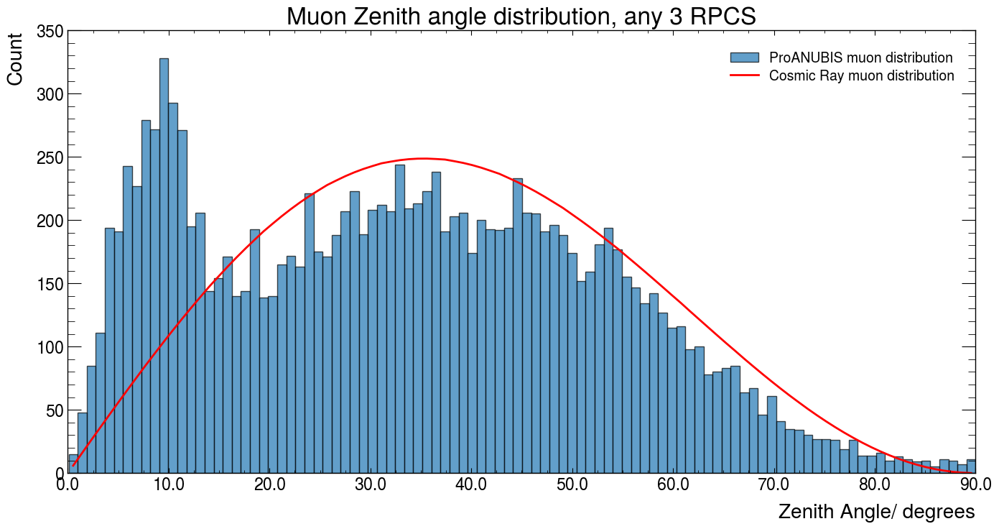

In [315]:
plot_zenith_angle_distribution(angles_3, "Muon Zenith angle distribution, any 3 RPCS")

In [16]:
d_vertical = np.array([0,1,1])
angles = []

for i,filtered_event in enumerate(all_6_rpcs):
    
    result = reconstruct(filtered_event,3)

    if result is not None:
        #Only save angles that actually were reconstructed well
        theta = np.arccos(np.dot(d_vertical,result[1]) / ((np.sqrt(2))*np.linalg.norm(result[1])))
        if theta > np.pi /2:
            theta= np.pi - theta
        if theta> 1.396:
            print(i)
            
        angles.append(theta)

    #ProAnubis setup is at 45 degrees to vertical. 

Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to r

In [17]:
print(len(angles))
print(angles)

1854
[0.5951256005034907, 0.8596812683960314, 0.6439248845360193, 0.6633802207249615, 0.47297767217478104, 0.9477841533242101, 1.1334538351808958, 1.0926224883384623, 0.698766567214921, 0.4147263760727289, 0.9474269000510652, 0.851387460672931, 1.2200042083212626, 0.7764581322598425, 0.8554964990807359, 0.9336901263827738, 0.5725282047605951, 0.8141190855802392, 0.6532904018460219, 0.8157773206427306, 0.7846178179220891, 1.0201912383968503, 0.5902918946167923, 0.4015892510807288, 0.6566656470938752, 0.9303186476658573, 0.7172637749845364, 1.1807226619052462, 0.8108573440048704, 1.0290052418881297, 0.6889085552626694, 0.8101527799548708, 0.9817945912034398, 0.9089429125143279, 0.9282186278079422, 0.7978549301559906, 1.235303729405957, 0.5342046536496359, 0.8322313890919716, 0.28308319669341525, 1.2185419770745956, 0.9337627879956313, 1.2390100623847478, 0.8483687329421447, 1.0804949707311065, 0.5970566545346493, 0.9539793714541309, 0.7745685176751351, 0.6681699543264905, 0.6340669090696

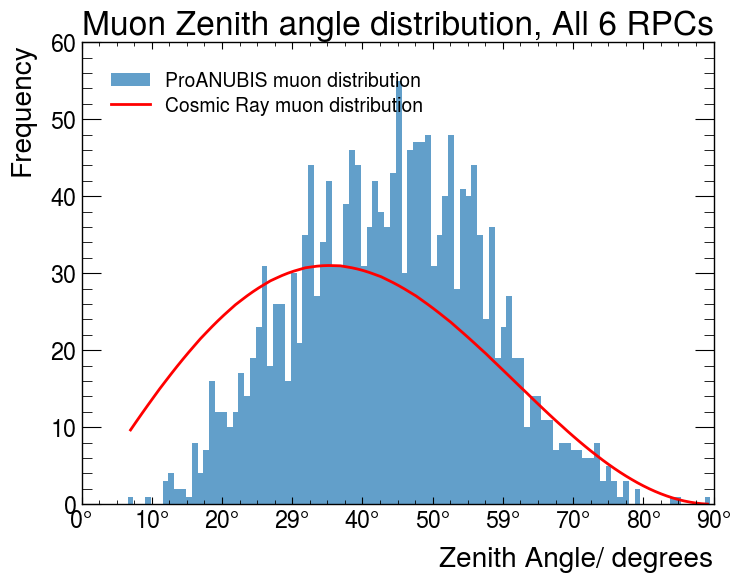

In [18]:
plot_zenith_angle_distribution(angles, "Muon Zenith angle distribution, All 6 RPCs")

Switching cluster_max_size from 3 to 5 allowed the event to be reconstructed more accurately. Event tag: Event 13115, 249 ns

In [120]:
test1 = reconstruct(any_3_rpcs[2883],5)

In [121]:
ANT.interactive_muon_plot(test1[0],test1[1],test1[2])

In [151]:
print(test1[1])
print(test1[4])

[ 9.99658568e-01 -2.61272946e-02  3.34610712e-04]
4.046733947580375


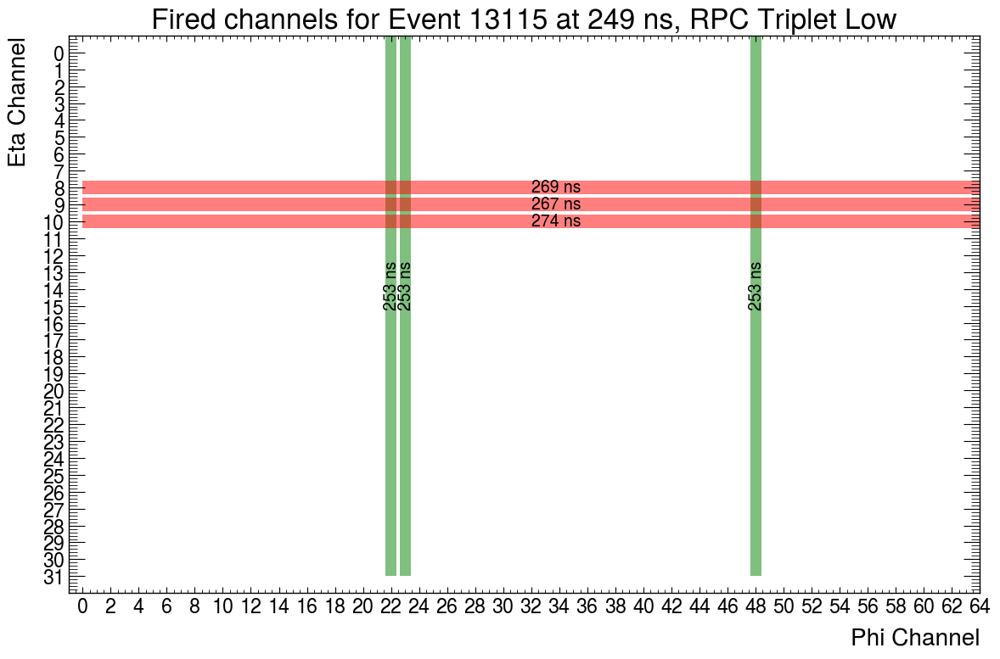

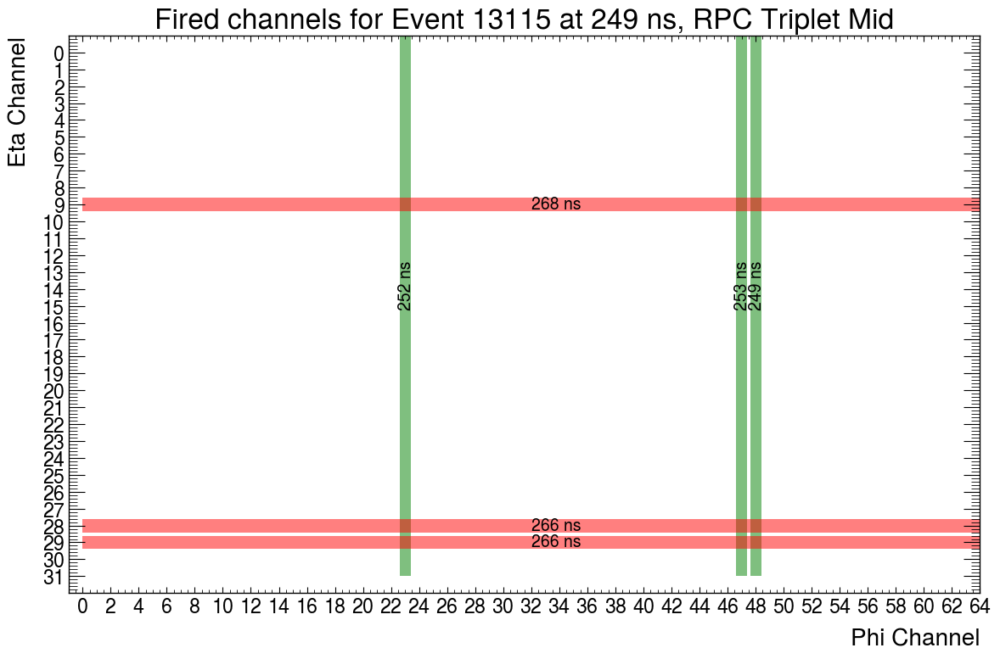

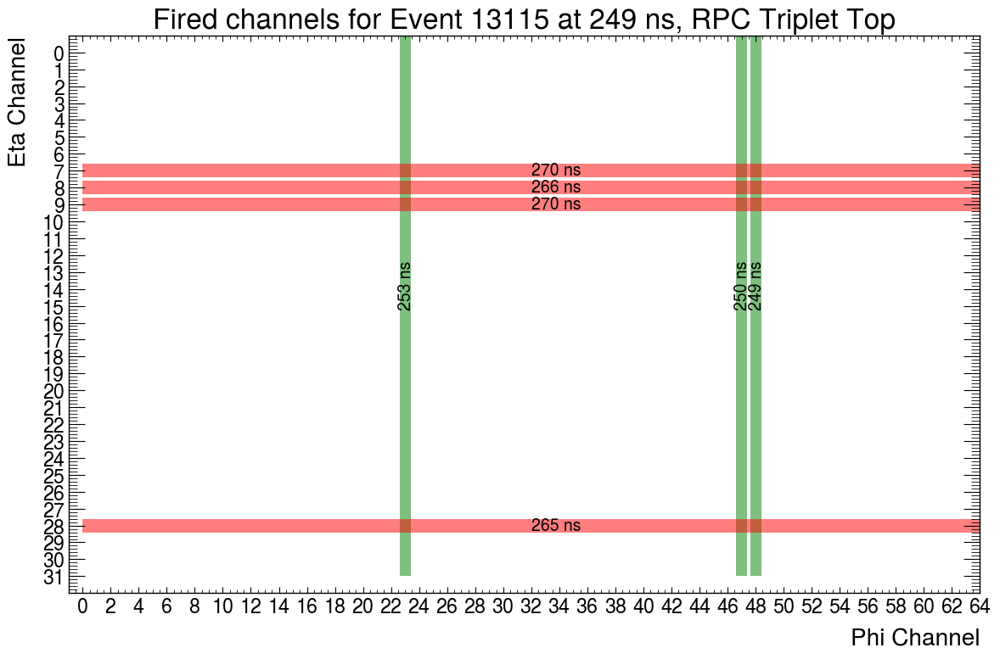

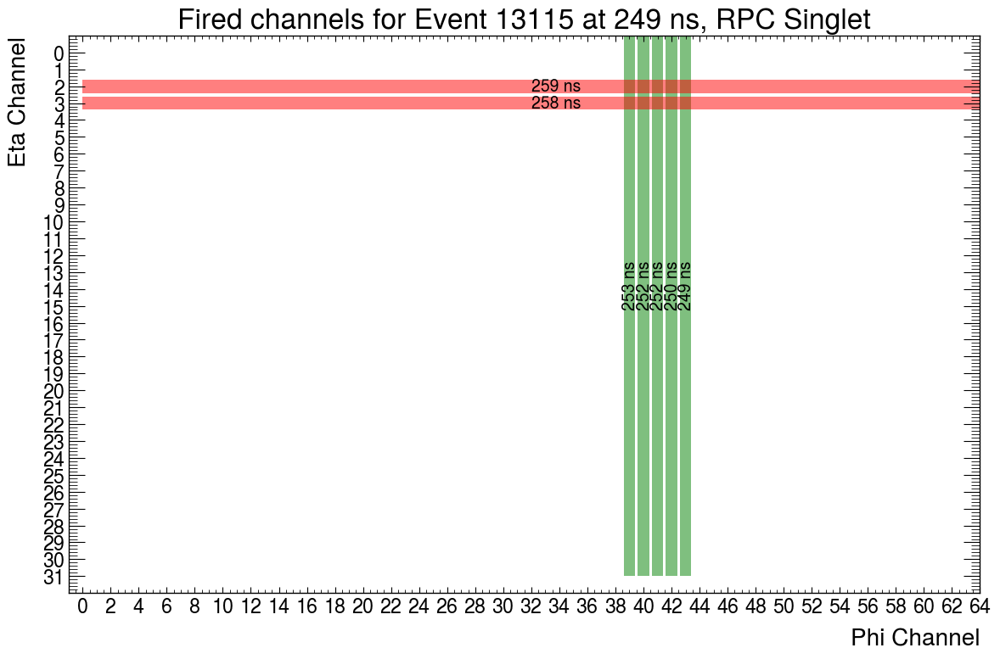

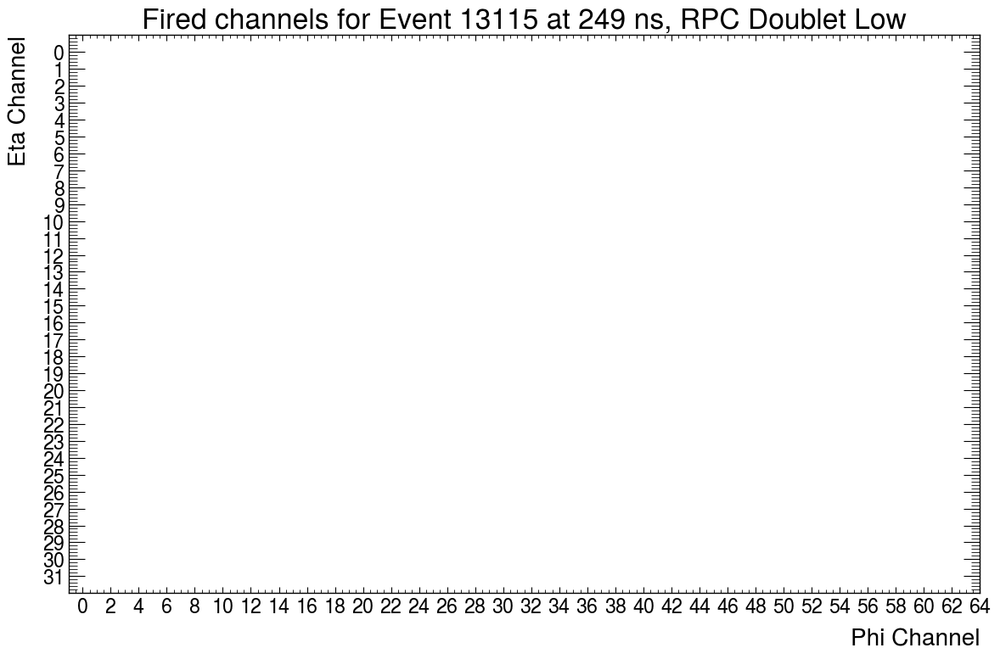

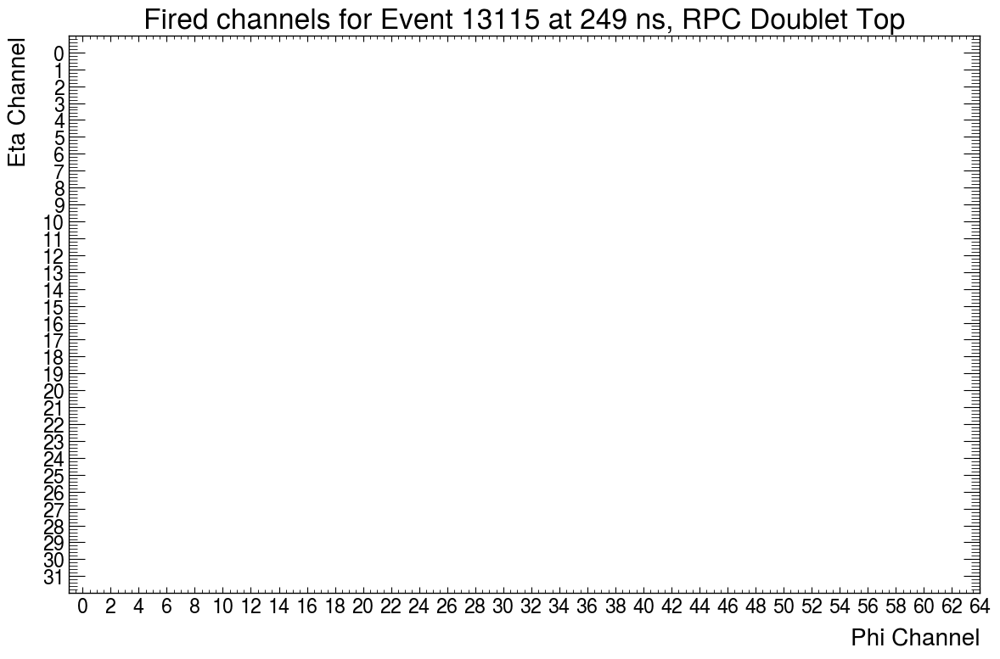

In [176]:
ANT.plot_event_cluster(ANT.convert_cluster_to_plot(any_3_rpcs[2883]))

In [117]:
theta = np.arccos(np.dot(d_vertical,test1[1]) / ((np.sqrt(2))*np.linalg.norm(test1[1])))
print(theta)

1.4304277605902609


In [129]:
#Plotting with larger cluster sizes:

d_vertical = np.array([0,1,1])
angles_4 = []

for i,filtered_event in enumerate(all_6_rpcs):

    result = reconstruct(filtered_event,3)

    if result is not None:
        #Only save angles that actually were reconstructed well
        theta = np.arccos(np.dot(d_vertical,result[1]) / ((np.sqrt(2))*np.linalg.norm(result[1])))
        if theta > np.pi /2:
            theta= np.pi - theta
        if theta > 1.40:
            print(i)
        angles_4.append(theta)

    #ProAnubis setup is at 45 degrees to vertical. 

Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to r

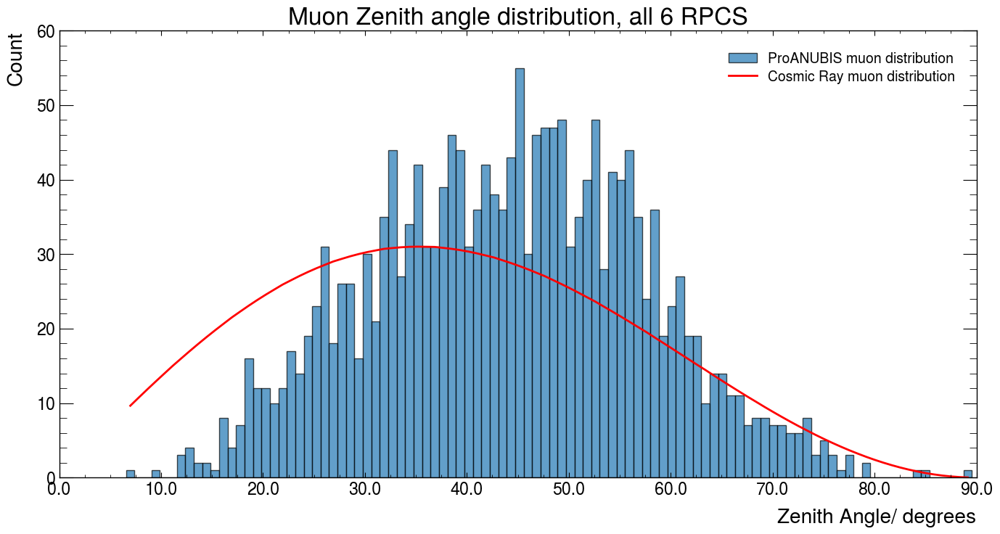

In [316]:
plot_zenith_angle_distribution(angles_4, "Muon Zenith angle distribution, all 6 RPCS")

Plotting phi and eta angles separately

In [27]:
def extract_angles_phi_eta(filtered_events):

    #Input is filtered_events, output of ANT.filter_events() function

    angles_eta = []
    angles_phi = []

    for i,filtered_event in enumerate(filtered_events):

        result = reconstruct(filtered_event,3)

        if result is not None:
            #Only save angles that actually were reconstructed well
            
            # a.b = |a||b|cos(x)

            #eta angle. 
            #work out the projection of the direction vector in the plane.
            
            v_parr_eta = np.array([0,result[1][1],result[1][2]])

            theta_eta = np.arccos(np.dot(v_parr_eta,[0,0,1]) / np.linalg.norm(v_parr_eta))

            if (theta_eta) > np.pi / 2:
                theta_eta= np.pi - theta_eta
            
            if v_parr_eta[1] > 0:
                theta_eta*=-1

            angles_eta.append(theta_eta)

            if -52.5 < theta_eta < 47.5:
                print(i)

            # Phi angles
            #work out the projection of the direction vector in the plane.
            
            v_parr_phi = np.array([result[1][0],0,result[1][2]])

            theta_phi = np.arccos(np.dot(v_parr_phi,[0,0,1]) / np.linalg.norm(v_parr_phi))

            if theta_phi > np.pi / 2:
                theta_phi= np.pi - theta_phi
            
            if v_parr_phi[0] < 0:
                theta_phi*=-1

            angles_phi.append(theta_phi)

    return angles_eta, angles_phi

        #ProAnubis setup is at 45 degrees to vertical. 
        #Project direction vector onto planes to work out phi and eta angular distributions. Should be no assymmetry in phi.
        #Expect asymmetry in eta. 

In [28]:
def plot_angle_distribution(angles, title):

    plt.figure(figsize=(16,10))

    # Plot histogram with counts
    plt.hist(angles, bins=61, density=True,edgecolor='black',alpha=0.7, label='ProANUBIS muon distribution')

    # Define the cosine squared function and plot it
    x = np.linspace(-np.pi/2, np.pi/2, 100)
    cos_squared = 2/np.pi * np.cos(x)**2
    plt.plot(x, cos_squared, color='red', label='Cosmic Muon distribution')

    # Convert radians to degrees for x-ticks
    x_ticks_degrees = np.linspace(-90, 90, num=19)
    x_ticks_radians = np.radians(x_ticks_degrees)

    # Set x-ticks labels and positions
    plt.xticks(x_ticks_radians, x_ticks_degrees)

    plt.text(-1,1.1,f"Number of events = {len(angles)}")

    # Customize the plot
    plt.xlabel('Angle/ degrees from axis perpendicular to surface of RPCs')
    plt.ylabel('Relative Occurence')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()


In [29]:
test_50 = reconstruct(any_3_rpcs[0],3)
ANT.interactive_muon_plot(test_50[0],test_50[1],test_50[2])

0
Failed to reconstruct, not enough coords
2
3
Failed to reconstruct, not enough coords
5
6
Failed to reconstruct, not enough coords
Failed to reconstruct
9
Failed to reconstruct, not enough coords
11
12
Failed to reconstruct, not enough coords
Failed to reconstruct
15
16
Failed to reconstruct, not enough coords
18
19
20
Failed to reconstruct
Failed to reconstruct, not enough coords
23
24
25
Failed to reconstruct, not enough coords
27
28
29
30
31
32
33
34
35
36
Failed to reconstruct, not enough coords
38
39
Failed to reconstruct, not enough coords
41
42
43
44
45
46
Failed to reconstruct
Failed to reconstruct, not enough coords
49
Failed to reconstruct, not enough coords
51
52
53
54
55
56
Failed to reconstruct, not enough coords
58
59
60
61
62
Failed to reconstruct, not enough coords
64
65
66
67
68
69
70
71
Failed to reconstruct, not enough coords
73
74
Failed to reconstruct, not enough coords
76
77
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
80
81


C:\Users\patri\AppData\Local\Temp\ipykernel_12188\1823537219.py:22: RuntimeWarning:

invalid value encountered in scalar divide



Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
7274
7275
7276
7277
7278
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
7281
Failed to reconstruct, not enough coords
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
Failed to reconstruct, not enough coords
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
7310
Failed to reconstruct, not enough coords
7312
7313
7314
7315
7316
7317
7318
7319
7320
Failed to reconstruct, not enough coords
7322
7323
7324
7325
7326
7327
Failed to reconstruct
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
7331
7332
7333
7334
7335
7336
Failed to reconstruct, not enough coords
7338
7339
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not eno

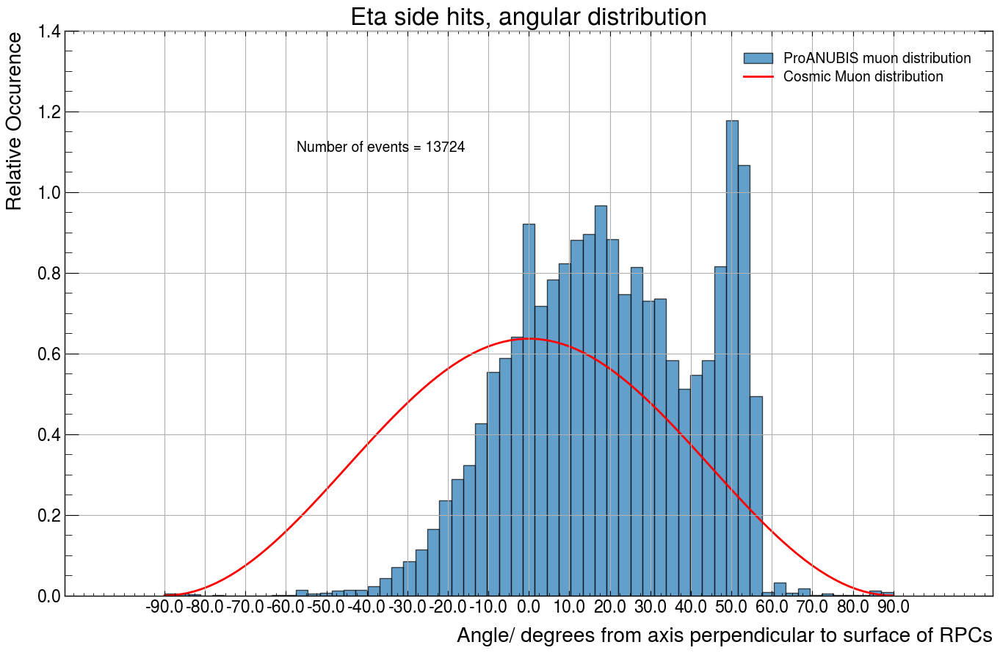

In [30]:
angles_eta, angles_phi = extract_angles_phi_eta(any_3_rpcs)

plot_angle_distribution(angles_eta,"Eta side hits, angular distribution")

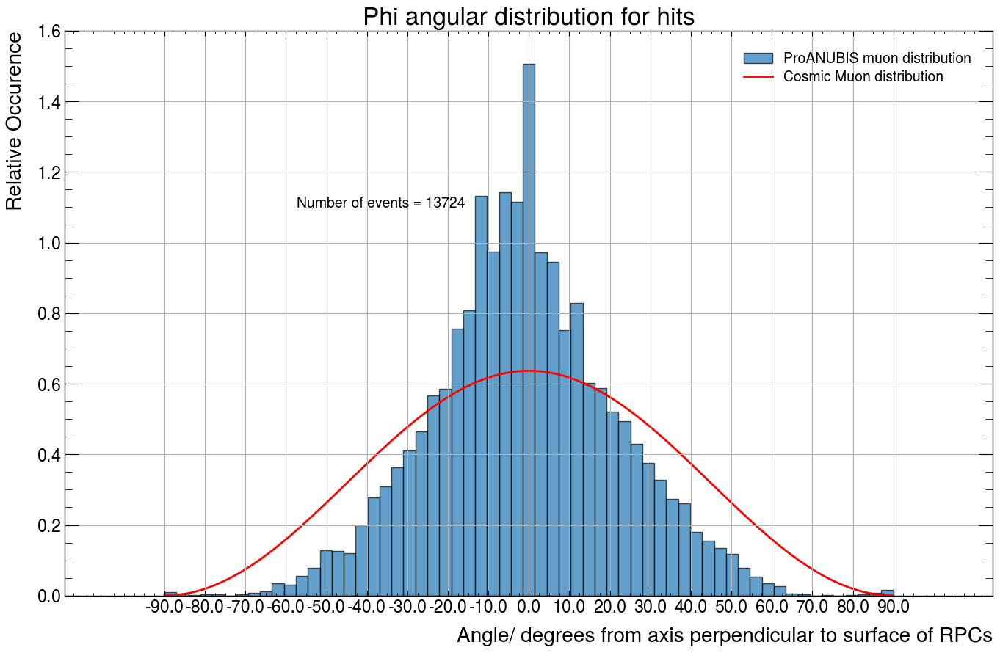

In [23]:
plot_angle_distribution(angles_phi,"Phi angular distribution for hits")